In [1]:
import pandas as pd
import dataframe_image as dfi
import numpy as np
import scipy
from pykalman.pykalman import *
import control

import matplotlib.pyplot as plt
import seaborn as sns
sns.set(font_scale=1.5)
from statannotations.Annotator import Annotator
import statsmodels.formula.api as smf
import statsmodels as stats

import prep_emotioncon 
import emotioncon_modelling
import emotioncon_stats
import auxiliary

In [2]:
emo = emotioncon_modelling.Modelling()
emostats = emotioncon_stats.Statistics()
prep = prep_emotioncon.PrepEmotioncon()
aux = auxiliary.Auxiliary()
attention_cr = np.array([1, 0, 0, 1, 1, 1, 1, 0, 0, 0])
mood_categories = ['disgusted', 'amused', 'calm', 'anxious', 'sad']
filepath = '/Users/jolandamalamud/phd/projects/emotioncon/'
data = np.load(filepath + '/results/data_experiment2.npy',allow_pickle='TRUE')
savefig = True
palette= {0: "plum", 1: "purple", 2: "lightgrey", 3: "grey"}

In [3]:
# make inputs ready
input_df = pd.read_csv(filepath + 'experiment/public/prep/videosForExperiment.csv')
inp_dummies = pd.get_dummies(input_df['category'])
inp_dummies = inp_dummies.reindex(columns=['Disgust', 'Amusement', 'Calmness', 'Anxiety', 'Sadness'])
inp = inp_dummies.values
inp = np.vstack([np.zeros(np.shape(inp)[1]), inp, np.zeros(np.shape(inp)[1]), inp])

In [4]:
df, mood_ratings, foo = prep.create_df_from_dict(data)

In [5]:
# define option for modelling
def define_kf_options(data, inp):
    options = {'cov': 'diagonal', 'inputs' : True, 'inp': inp}
    options['n_dim_obs'] = np.shape(data)[1]
    options['n_dim_state'] = options['n_dim_obs']
    options['n_dim_control'] = np.shape(inp)[1]
    options['maxiter'] = 100
    options['constraint control'] = False
    options['em_vars'] = ['transition_matrices', 'transition_offsets', 'control_matrix', \
                          'observation_covariance', 'transition_covariance']
    options['A'] = np.zeros((options['n_dim_state'],options['n_dim_state']))
    options['h'] = np.zeros(options['n_dim_state'])
    options['C'] = np.zeros((options['n_dim_state'],options['n_dim_control']))
    return options

In [6]:
sns.set(font_scale=1.5)
data = np.load(filepath + 'results/data_experiment.npy',allow_pickle='TRUE')
df, mood_ratings, foo = prep.create_df_from_dict(data)
Nsj = len(data)
print('N = ' + str(Nsj))

N = 108


----------------------------------------------------------------------------------------------------
Model Comparison:
--
- only noise: S and G diag, no transition matrix, no control
- dynamics + noise: S and G diag, control matrix
- control + noise: S and G diag, control matrix
- control, dynamics + noise: S and G, transition and control matrix

In [6]:
# fit KF using different parameter constellations
fitting_combinations = [['S', 'G'], ['A', 'S', 'G'], ['A', 'h', 'S', 'G'], ['C', 'S', 'G'], \
                        ['A', 'C', 'S', 'G'], ['A', 'h', 'C', 'S', 'G']]
fitting_combinations_C = [i for i in fitting_combinations if 'C' in i]   
Nsj = np.shape(mood_ratings)[2]
ll_all_subjects = np.empty((len(fitting_combinations + fitting_combinations_C),Nsj))
results = []
for sj in range(Nsj):
    data_to_fit = mood_ratings[:,:,sj]
    T = np.shape(data_to_fit)[0]
    opt = define_kf_options(data_to_fit, inp)
    results = []
    for j,i in enumerate(fitting_combinations):
        opt['em_vars'] = emo.parameter_short(i)
        kf_alldata = emo.run_KF(data_to_fit, opt)
        ll_all_subjects[j,sj] = kf_alldata.loglikelihood(data_to_fit, control_inputs=inp)
        results.append(kf_alldata)
        
    for j,i in enumerate(fitting_combinations_C):
        opt['constraint control'] = True
        opt['em_vars'] = emo.parameter_short(i)
        kf_alldata = emo.run_KF(data_to_fit, opt)
        ll_all_subjects[j+len(fitting_combinations),sj] = kf_alldata.loglikelihood(data_to_fit, control_inputs=inp)
        results.append(kf_alldata)

    data[sj]['results'] = results
    data[sj]['ll'] = ll_all_subjects[:,sj]

np.save(filepath + 'results/fit_experiment.npy', data)

In [7]:
# loglikelihood
ll_all_subjects = np.empty((len(data[0]['ll']),Nsj))
for i in range(Nsj):
    ll_all_subjects[:,i] = data[i]['ll']
np.mean(ll_all_subjects,axis=1)

array([-2724.98361113, -2350.73165471, -2343.31716843, -2335.23444202,
       -2217.21101085, -2214.49717497, -2575.65812146, -2469.6643974 ,
       -2465.04909094])

In [32]:
# bestmodel mainly driven by only a few participants
Ndatapoints = np.prod(np.shape(data[0]['ratings']))
bic,bestmodel=[],[]
for i in range(Nsj):
    a, b = emo.AICBIC_calc(ll_all_subjects[:,i], Ndatapoints*np.ones(len(data[0]['ll'])), \
                np.array([10, 35, 40, 35, 60, 65, 40, 45, 50]))
    bestmodel.append(np.where(b==min(b))[0])
    bic.append(b)
np.histogram(bestmodel,range=(0,len(data[0]['ll'])), bins=len(data[0]['ll']))

(array([ 0, 23,  0, 47, 38,  0,  0,  0,  0]),
 array([0., 1., 2., 3., 4., 5., 6., 7., 8., 9.]))

In [36]:
# calculate AIC and BIC 
Ndatapoints = np.prod(np.shape(mood_ratings)[:2])
aic, bic = emo.AICBIC_calc(np.nanmean(ll_all_subjects,axis=1), Ndatapoints*np.ones(len(data[0]['ll'])), \
                np.array([10, 35, 40, 35, 60, 65, 40, 45, 50]))
np.round(bic,2)

array([5513.07, 4922.31, 4939.03, 4891.32, 4813.02, 4839.14, 5403.71,
       5223.28, 5245.59])

In [42]:
# evidence ratio 
for i in range(len(bic)):
    print(np.round(np.exp(-0.5*(bic[4]-min(bic))))/np.exp(-0.5*(bic[i]-min(bic))))

1.032217278051432e+152
5.404371900971473e+23
2.3098377586942633e+27
1.0055212903750699e+17
1.0
470221.81610568444
1.853426190859878e+128
1.2200918975437576e+89
8.568348881392851e+93


In [46]:
# accumulative weight
for i in range(len(bic)):
    print(np.exp(-(bic[i]-min(bic)))/sum(np.exp(-(bic-min(bic)))))

9.385507288524522e-305
3.423809127929446e-48
1.8742911179670958e-55
9.89048204545223e-35
0.9999999999954774
4.5226653212368475e-12
2.9110482810342494e-257
6.717611967916177e-179
1.3620897252361208e-188


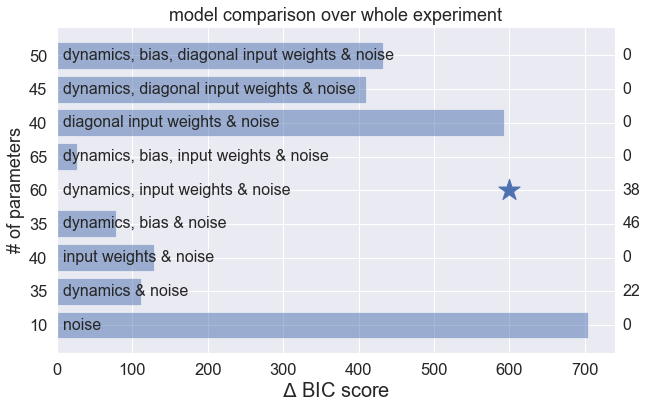

In [56]:
# plot BIC 
sns.set(font_scale=1.5)

fitting_labels = ['dynamics, bias, diagonal input weights & noise', \
                  'dynamics, diagonal input weights & noise', \
                  'diagonal input weights & noise', \
                  'dynamics, bias, input weights & noise', \
                  'dynamics, input weights & noise', \
                  'dynamics, bias & noise', \
                  'input weights & noise', \
                  'dynamics & noise', \
                  'noise']
fig, ax = plt.subplots(figsize=(10, 6))
b = ax.barh(np.arange(len(bic)), np.squeeze(np.array(bic - min(bic))), align='center', alpha=0.5)
ax.set_yticks(range(len(data[0]['ll'])))
ax.set_yticks(range(len(fitting_labels)))
ax.set_yticklabels([10, 35, 40, 35, 60, 65, 40, 45, 50])
ax.set_ylabel('# of parameters')
ax.set_xlabel('$\Delta$ BIC score', fontsize=20);
for bar, label in zip(ax.patches, fitting_labels[::-1]):
    ax.text(8, bar.get_y()+bar.get_height()/2, label, ha = 'left', va = 'center', size=16) 
for i in range(len(fitting_labels)):
    ax.text(750, i, sum(np.array(bestmodel)==i)[0], ha = 'left', va = 'center', size=16) 
ax.set_xlabel('$\Delta$ BIC score', fontsize=20);
ax.scatter(600, np.where(np.squeeze(np.array(bic - min(bic)))==0), marker = '*', s=500, \
          color=b.patches[0].get_facecolor()[:-1])
ax.set_title('model comparison over whole experiment');

----------------------------------------------------------------------------------------------------
Model Comparison before and after:
--
- all parameter same
- dynamics matrix differs before and after
- control matrix differs before and after
- control and dynamics matrices differ before and after
- noise covariances differ before and after
- dynamics matrix and noise covariances differ before and after
- control matrix and noise covariances differ before and after
- control, dynamics matrices, and noise covariances differ before and after

In [12]:
# fit KF using different parameter constellations before and after intervention
fitting_combinations =  [['A'], ['C'], ['A', 'C'], ['S', 'G'], ['A', 'S', 'G'], ['C', 'S', 'G'], ['A', 'C', 'S', 'G']]
Nsj = np.shape(mood_ratings)[2]
ll_all_subjects = np.empty((len(fitting_combinations)+1,Nsj))
for sj in range(Nsj):
    data_to_fit = mood_ratings[:,:,sj]
    T = np.shape(data_to_fit)[0]
    opt = define_kf_options(data_to_fit, inp)
    opt['em_vars'] = emo.parameter_short(['A', 'C', 'S', 'G'])
    kf_alldata = emo.run_KF(data_to_fit, opt)
    ll = [kf_alldata.loglikelihood(data_to_fit, control_inputs=inp)]
    results = [kf_alldata]
    opt = emo.save_kf_options(kf_alldata, opt)
    for i in fitting_combinations:
        ll_split = 0
        for t in range(2):
            mood_ratings_split = data_to_fit[t*int(T/2):t*int(T/2) + int(T/2),:]
            inputs_split = inp[t*int(T/2):t*int(T/2) + int(T/2),:]
            opt['inp'] = inputs_split 
            opt['em_vars'] = emo.parameter_short(i)
            kf = emo.run_KF(mood_ratings_split, opt)
            ll_split += kf.loglikelihood(mood_ratings_split, control_inputs=inputs_split)
            results.append(kf)
        ll.append(ll_split)
    
    ll_all_subjects[:,sj] = np.asarray(ll)
    data[sj]['results_split'] = results
    data[sj]['ll_split'] = ll_all_subjects[:,sj]
    
np.save(filepath + 'results/fit_experiment.npy', data)

In [70]:
# loglikelihood
ll_all_subjects = np.empty((len(data[0]['ll_split']),Nsj))
for i in range(Nsj):
    ll_all_subjects[:,i] = data[i]['ll_split']
np.mean(ll_all_subjects,axis=1)

array([-2217.21101085, -2188.8645883 , -2185.09470619, -2149.2816743 ,
       -2190.95751228, -2152.33617991, -2122.43395074, -2036.21723363])

In [71]:
# bestmodel mainly driven by only a few participants
Ndatapoints = np.prod(np.shape(data[0]['ratings']))
bic,bestmodel=[],[]
for i in range(Nsj):
    a, b = emo.AICBIC_calc(ll_all_subjects[:,i], Ndatapoints*np.ones(len(data[0]['ll_split'])), \
                np.array([60, 85, 85, 110, 70, 95, 95, 120]))
    bestmodel.append(np.where(b==min(b))[0])
    bic.append(b)
for g in range(2):
    print(np.histogram(np.array(bestmodel)[df['randomized_condition']==g], range=(0,len(data[0]['ll_split'])), bins=len(data[0]['ll_split'])))

(array([28,  0,  0,  0,  8,  0,  8, 13]), array([0., 1., 2., 3., 4., 5., 6., 7., 8.]))
(array([45,  0,  0,  0,  5,  0,  1,  0]), array([0., 1., 2., 3., 4., 5., 6., 7., 8.]))


In [76]:
# those participants on average seem to successfully apply the strategy based on self-report
x = np.squeeze(np.array(bestmodel) > 5)
df['intervention_success'][x & (df['randomized_condition']==0)].mean(), \
df['intervention_success'][~x & (df['randomized_condition']==0)].mean()

(2.6666666666666665, 1.8333333333333333)

In [77]:
# calculate AIC and BIC
aic, bic = emo.AICBIC_calc(np.nanmean(ll_all_subjects,axis=1), Ndatapoints*np.ones(len(data[0]['ll_split'])), \
                np.array([60, 85, 85, 110, 70, 95, 95, 120]))
aic,bic

(array([4554.42202171, 4547.7291766 , 4540.18941238, 4518.56334859,
        4521.91502456, 4494.67235982, 4434.86790148, 4312.43446726]),
 array([4813.0171184 , 4914.07223025, 4906.53246603, 4992.6543592 ,
        4823.60930403, 4904.11459625, 4844.31013791, 4829.62466065]))

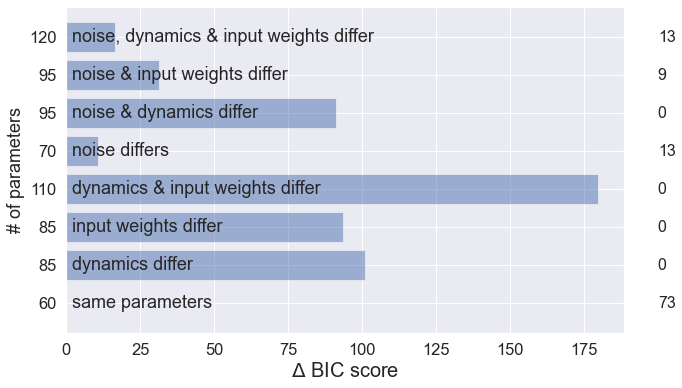

In [78]:
# bic all data
fitting_labels = ['noise, dynamics & input weights differ', \
                  'noise & input weights differ', \
                  'noise & dynamics differ', \
                  'noise differs', \
                  'dynamics & input weights differ', \
                  'input weights differ', \
                  'dynamics differ', \
                  'same parameters']
fig, ax = plt.subplots(figsize=(10, 6))
ax.barh(np.arange(len(bic)), np.squeeze(np.array(bic - min(bic))), align='center', alpha=0.5)
ax.set_yticks(range(len(fitting_labels)))
ax.set_yticklabels([60, 85, 85, 110, 70, 95, 95, 120])
ax.set_ylabel('# of parameters')
ax.set_xlabel('$\Delta$ BIC score', fontsize=20);
for bar, label in zip(ax.patches, fitting_labels[::-1]):
    ax.text(2, bar.get_y()+bar.get_height()/2, label, ha = 'left', va = 'center', size=18)
for i in range(len(fitting_labels)):
    ax.text(200, i, sum(np.array(bestmodel)==i)[0], ha = 'left', va = 'center', size=16) 

[4695.62165403 4792.08061372 4775.91005372 4852.27007381 4689.95605036
 4757.73148663 4643.76972398 4555.12692958]
[9.63643585e-062 1.23686559e-103 1.30348935e-096 8.96132286e-130
 2.78263885e-059 1.02319607e-088 3.18363689e-039 1.00000000e+000]
[4944.22381387 5050.41580166 5052.52222097 5149.55444286 4972.9864699
 5067.71924818 5068.44354171 5136.41624244]
[1.00000000e+00 7.61036844e-47 9.25975294e-48 6.69947644e-90
 3.22505556e-13 2.32602480e-54 1.12734711e-54 3.40321048e-84]


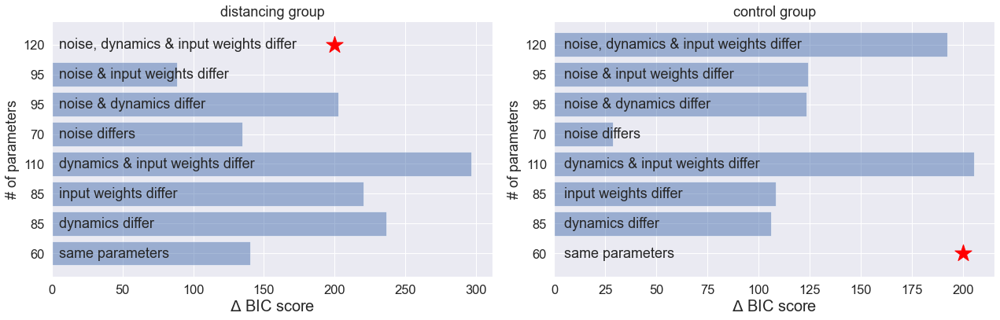

In [49]:
# bic separated for intervention condition
fig, ax = plt.subplots(1,2,figsize=(18, 6))
condition_label = ['distancing group', 'control group']
for i in range(2):
    aic, bic = emo.AICBIC_calc(np.nanmean(ll_all_subjects[:,df['randomized_condition']==i],axis=1), Ndatapoints*np.ones(len(data[0]['ll_split'])), \
                np.array([60, 85, 85, 110, 70, 95, 95, 120]))
    print(bic)
    print(np.exp(-(bic-min(bic)))/sum(np.exp(-(bic-min(bic)))))
    ax[i].barh(np.arange(len(bic)), np.squeeze(np.array(bic - min(bic))), align='center', alpha=0.5)
    ax[i].set_xlabel('$\Delta$ BIC score', fontsize=20);
    ax[i].set_title(condition_label[i])
    ax[i].set_yticks(range(len(fitting_labels)))
    ax[i].set_yticklabels([60, 85, 85, 110, 70, 95, 95, 120])
    ax[i].set_ylabel('# of parameters')
    ax[i].set_xlabel('$\Delta$ BIC score', fontsize=20);
    for bar, label in zip(ax[i].patches, fitting_labels[::-1]):
        ax[i].text(5, bar.get_y()+bar.get_height()/2, label, ha = 'left', va = 'center', size=18)
    ax[i].scatter(200, np.where(np.squeeze(np.array(bic - min(bic)))==0), marker = '*', s=500, color='red')
fig.tight_layout()

0 1.0


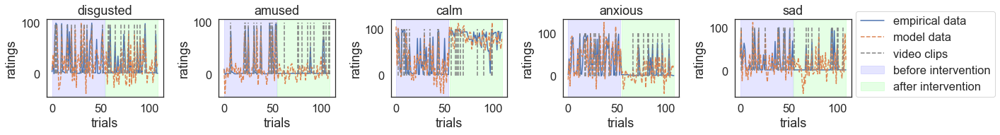

1 1.0


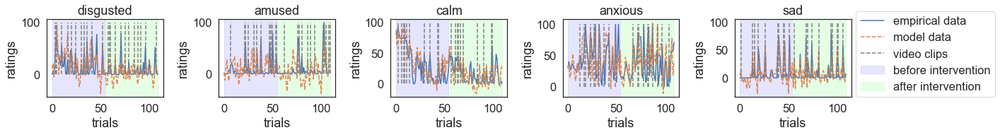

2 1.0


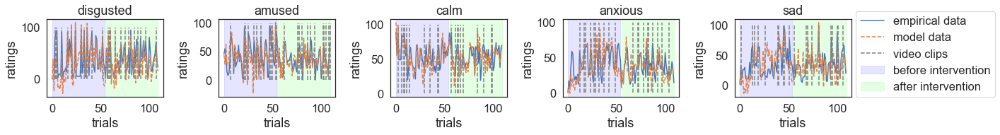

3 0.0


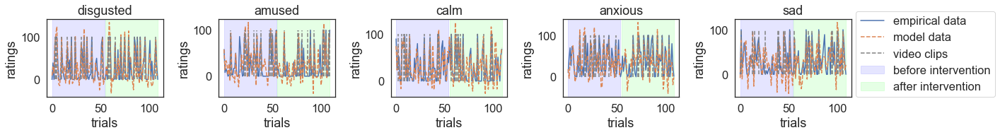

4 1.0


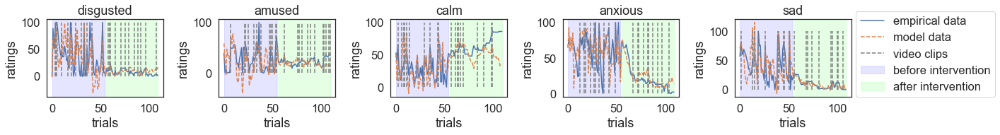

5 0.0


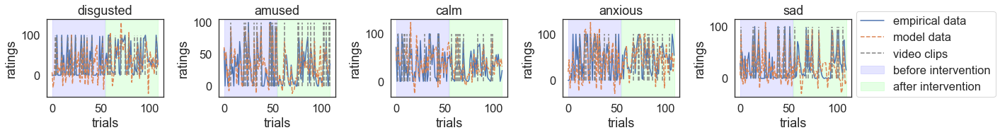

6 1.0


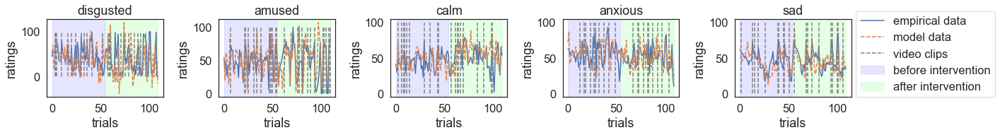

7 0.0


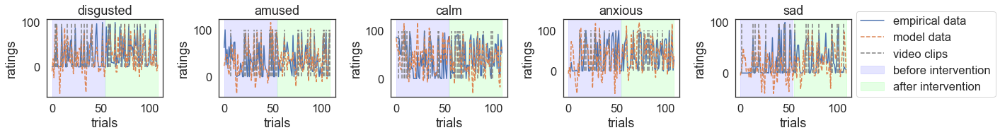

8 0.0


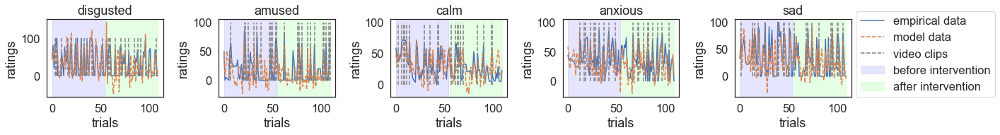

9 0.0


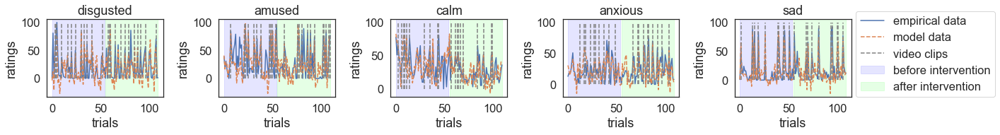

10 0.0


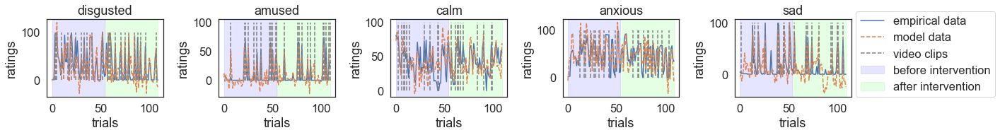

11 1.0


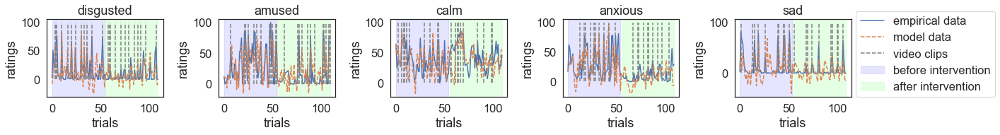

12 1.0


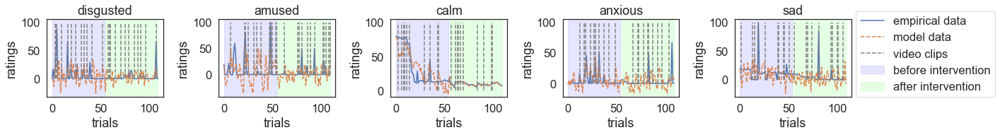

13 0.0


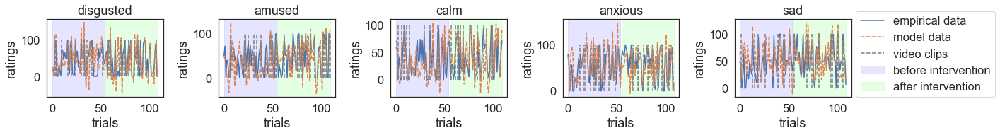

14 0.0


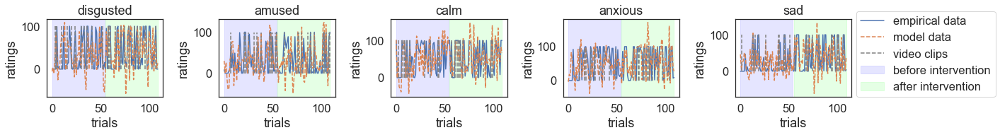

15 1.0


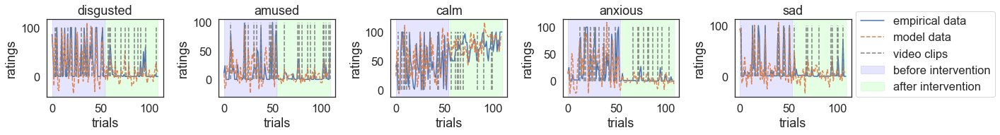

16 0.0


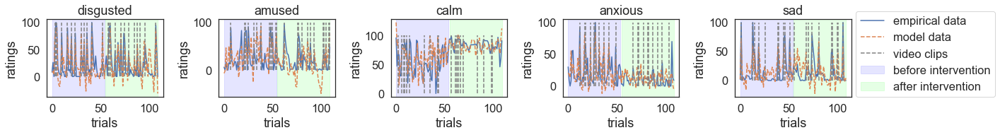

17 0.0


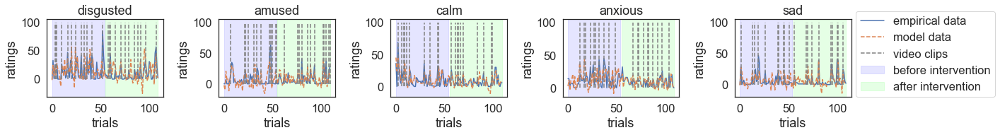

18 1.0


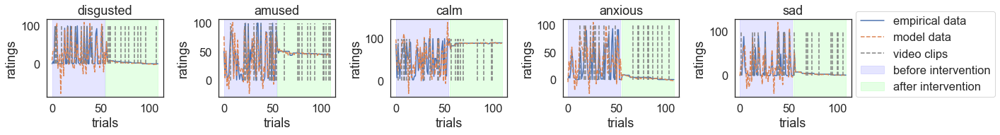

19 0.0


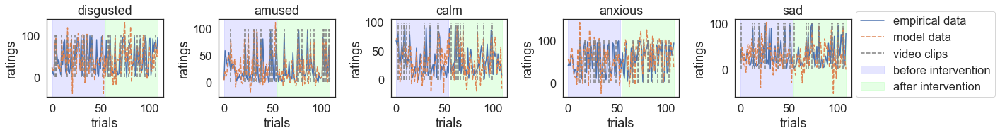

20 0.0


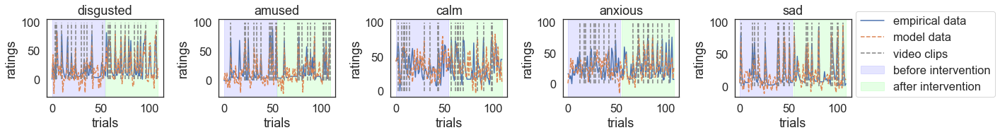

21 0.0


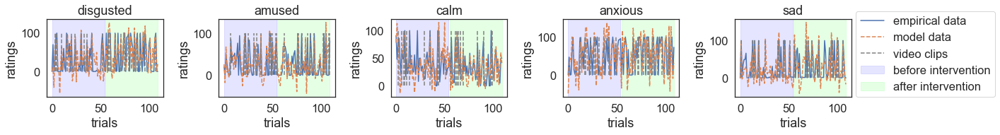

22 1.0


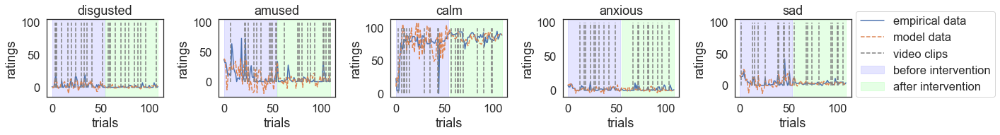

23 1.0


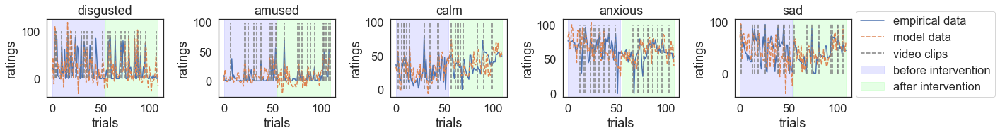

24 1.0


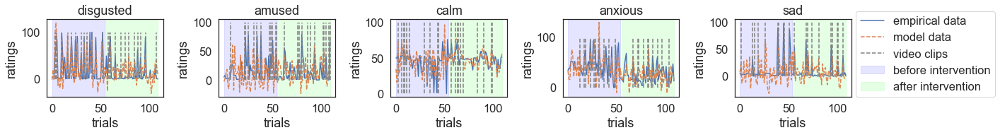

25 1.0


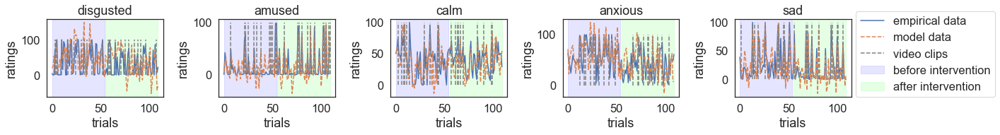

26 0.0


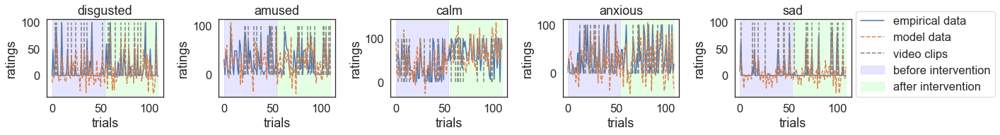

27 1.0


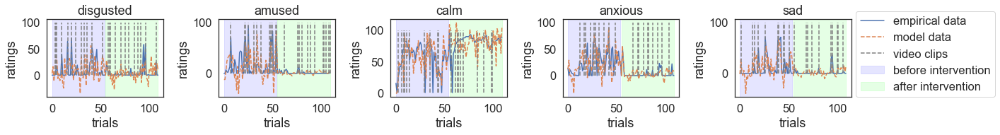

28 0.0


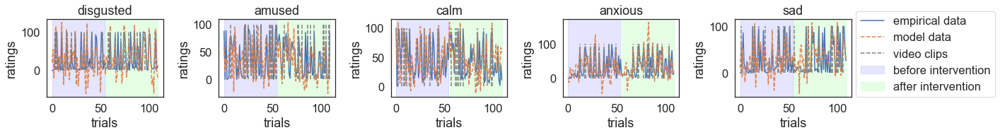

29 0.0


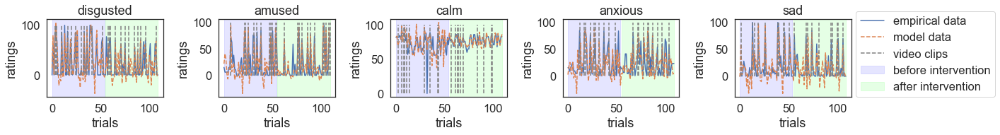

30 1.0


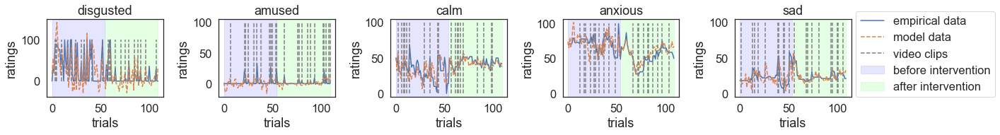

31 1.0


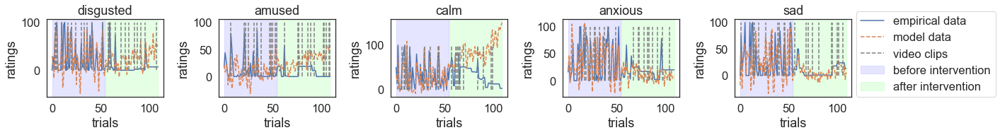

32 1.0


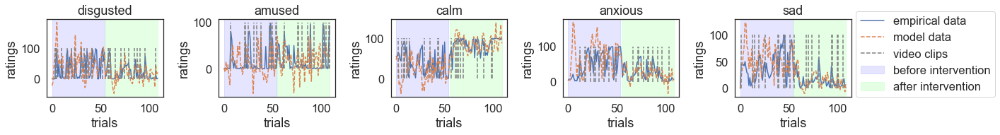

33 1.0


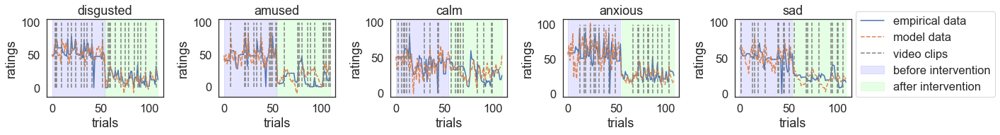

34 1.0


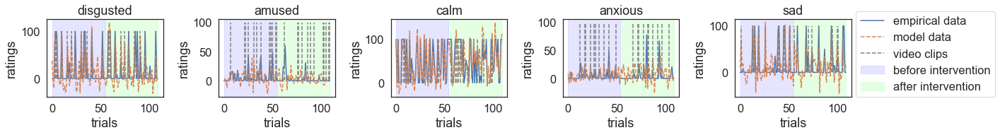

35 0.0


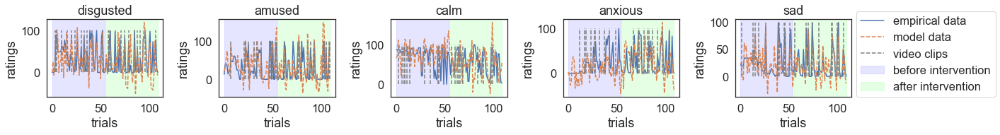

36 1.0


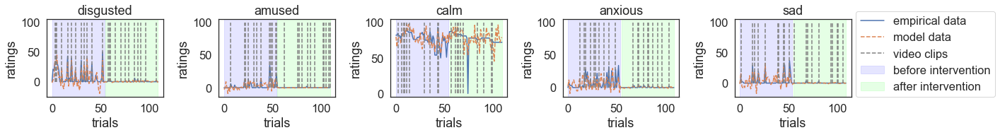

37 0.0


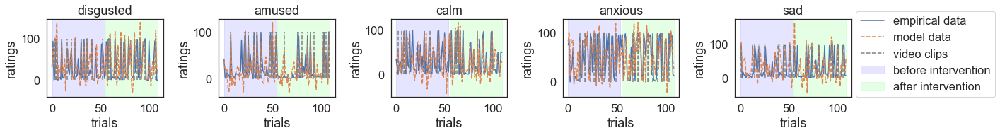

38 1.0


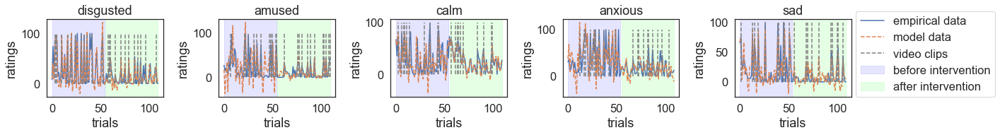

39 1.0


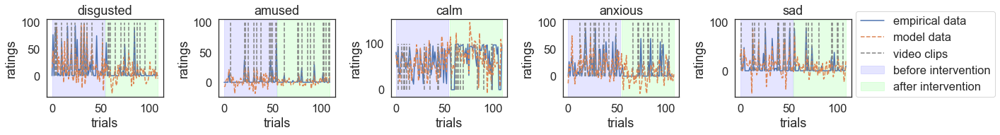

40 1.0


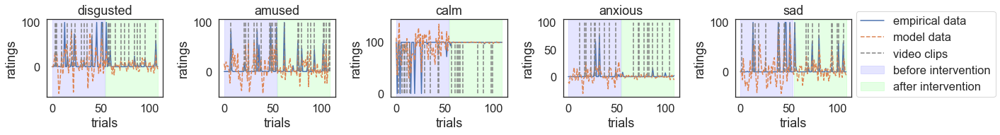

41 1.0


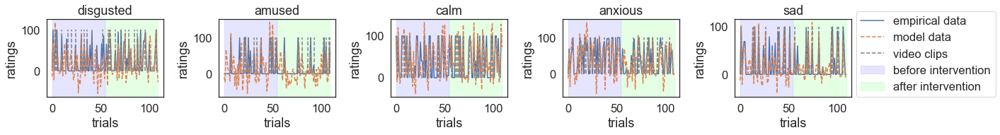

42 0.0


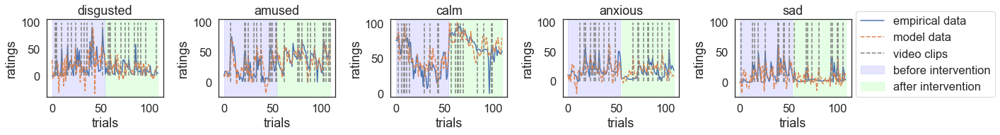

43 1.0


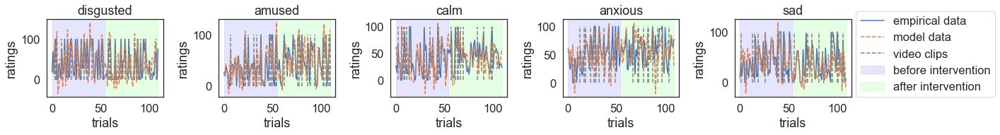

44 1.0


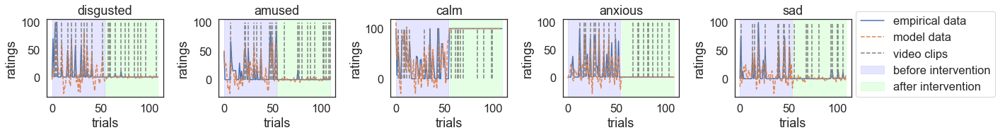

45 1.0


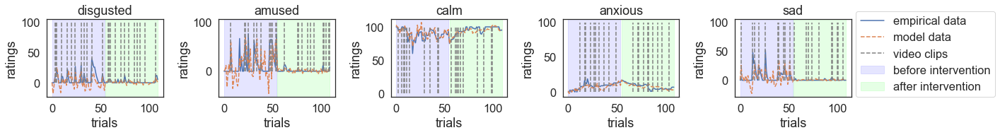

46 1.0


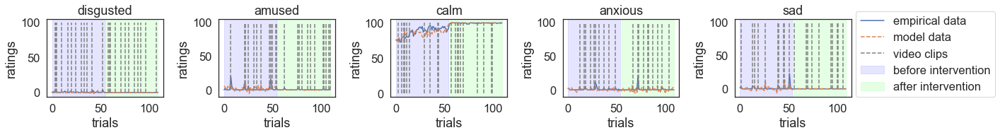

47 1.0


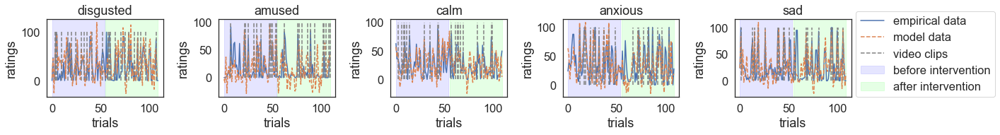

48 0.0


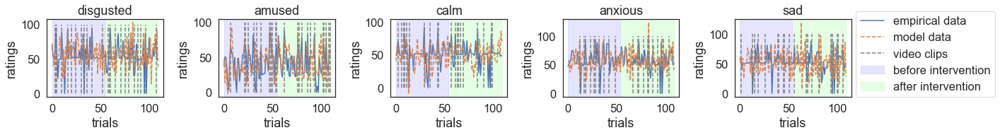

49 0.0


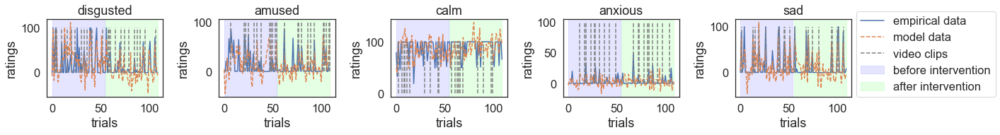

50 0.0


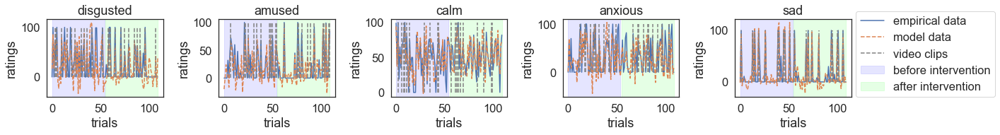

51 1.0


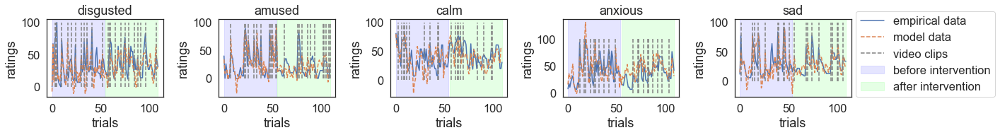

52 1.0


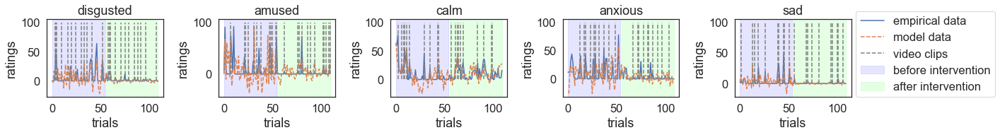

53 1.0


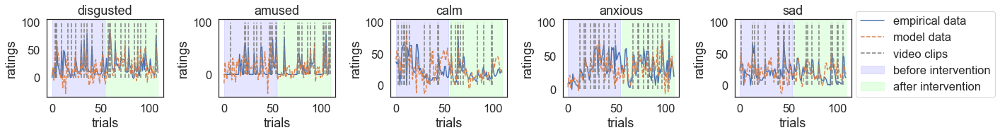

54 0.0


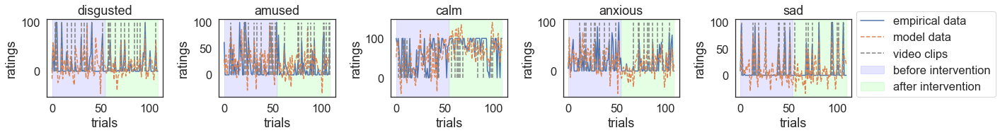

55 0.0


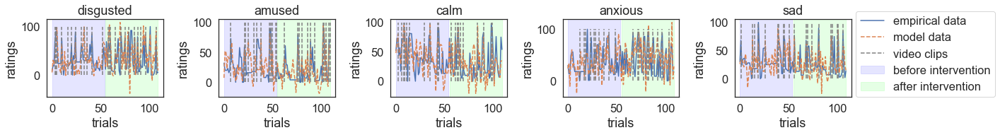

56 0.0


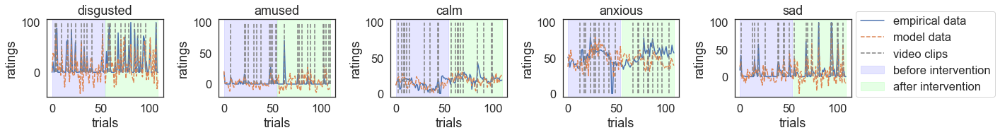

57 0.0


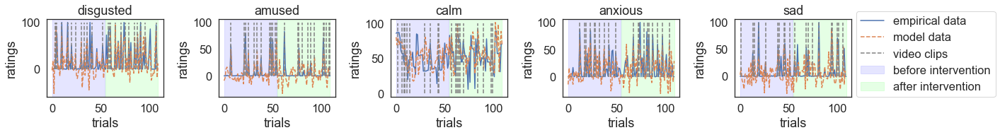

58 0.0


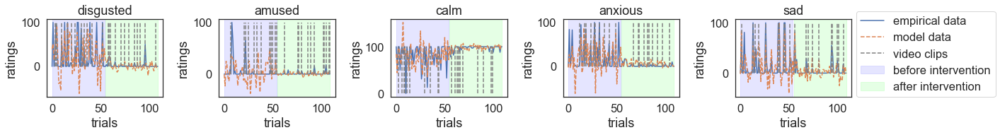

59 1.0


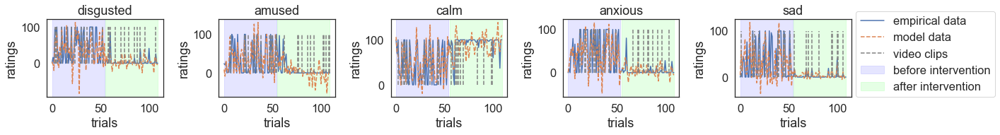

60 0.0


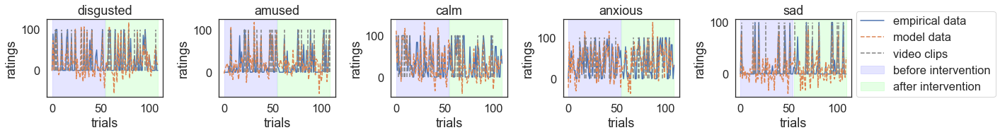

61 1.0


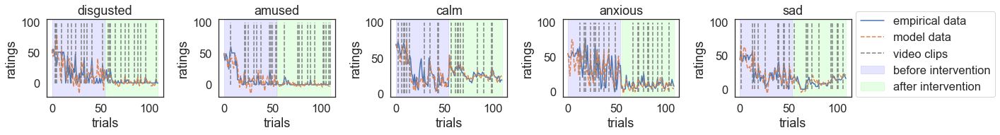

62 1.0


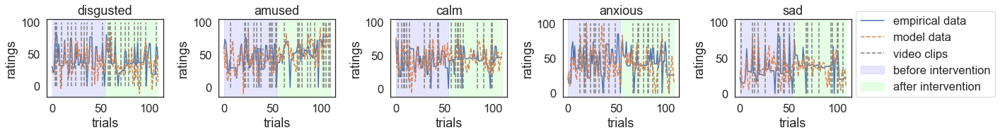

63 0.0


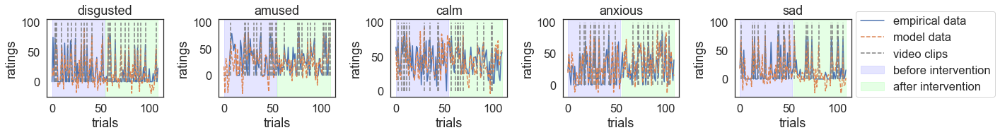

64 1.0


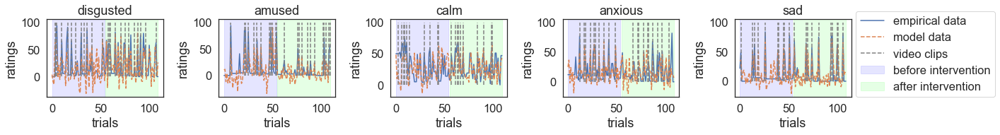

65 1.0


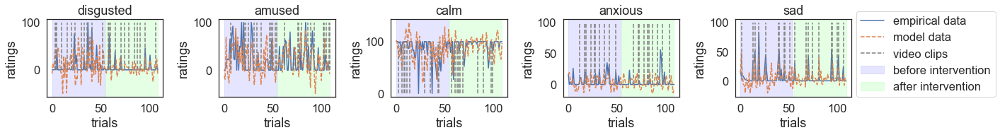

66 1.0


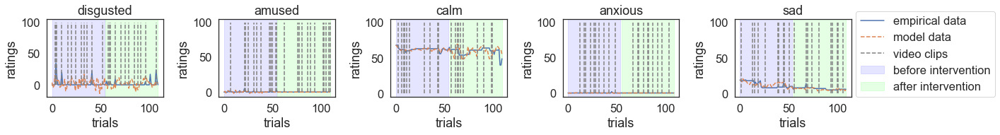

67 1.0


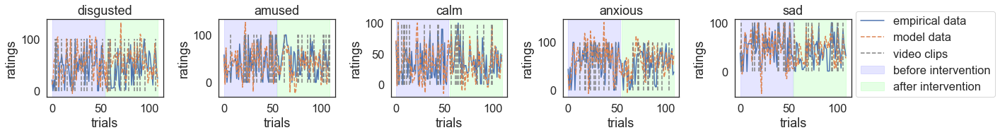

68 0.0


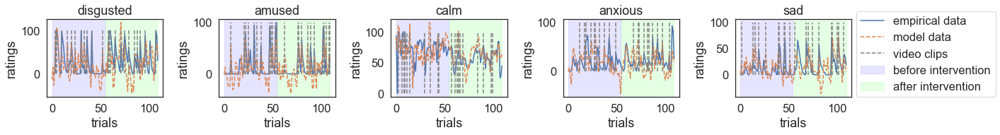

69 1.0


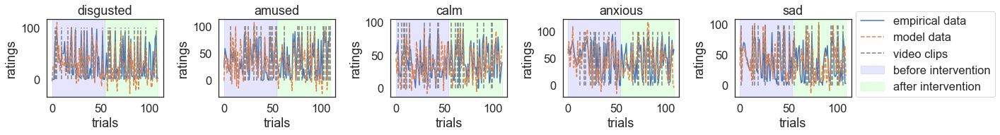

70 1.0


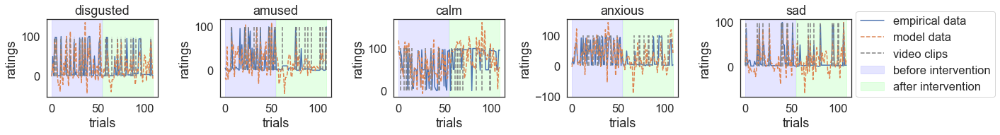

71 0.0


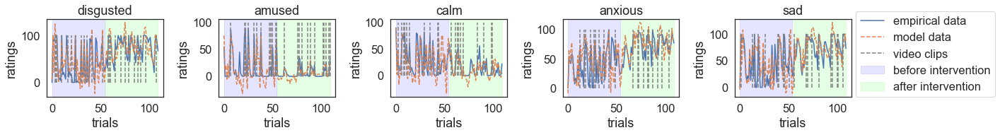

72 0.0


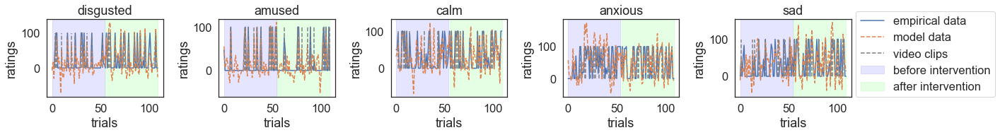

73 1.0


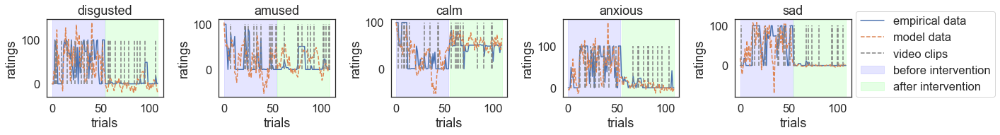

74 1.0


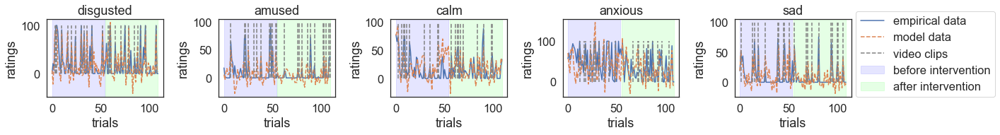

75 0.0


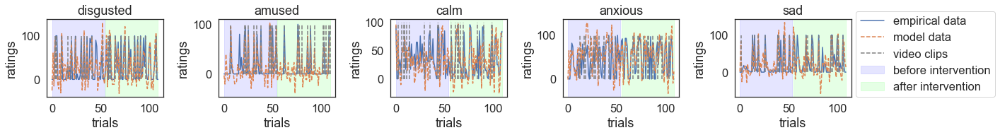

76 1.0


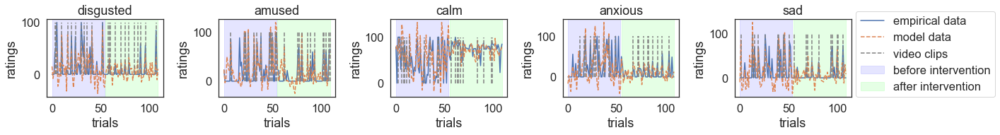

77 1.0


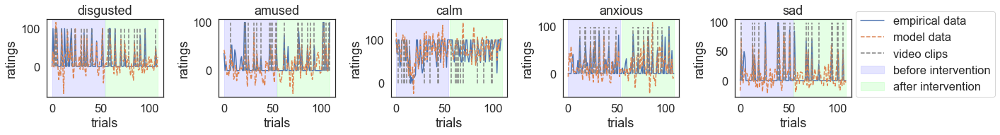

78 0.0


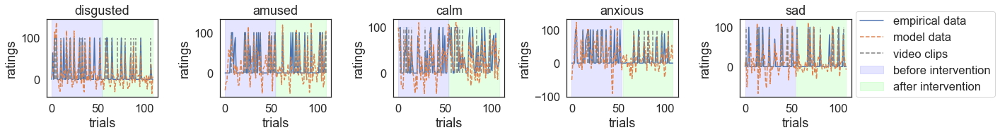

79 0.0


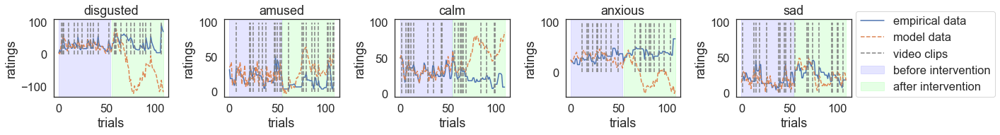

80 1.0


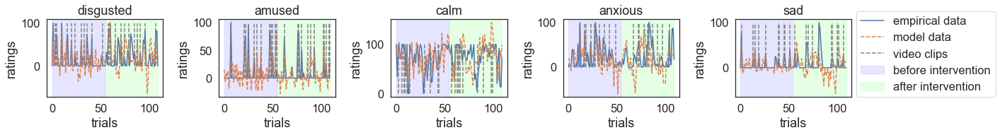

81 1.0


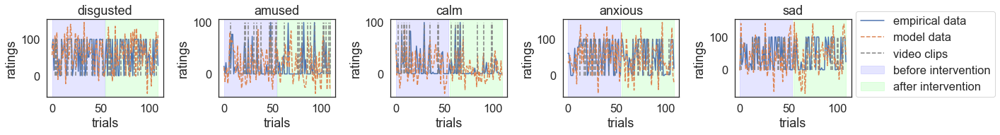

82 0.0


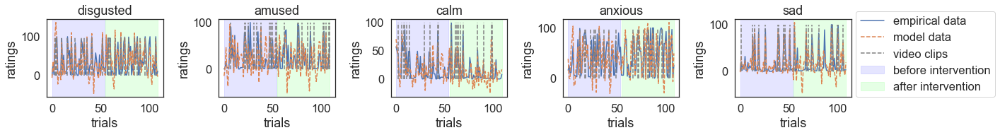

83 1.0


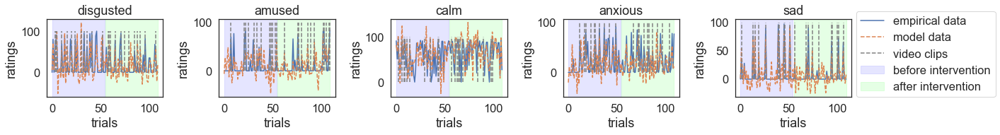

84 0.0


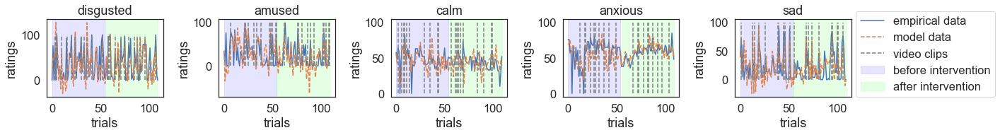

85 1.0


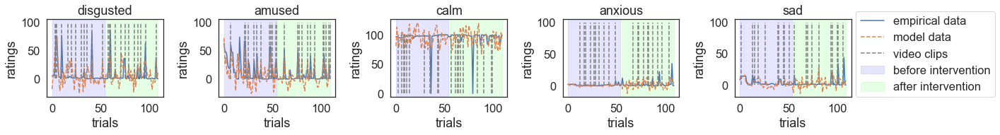

86 0.0


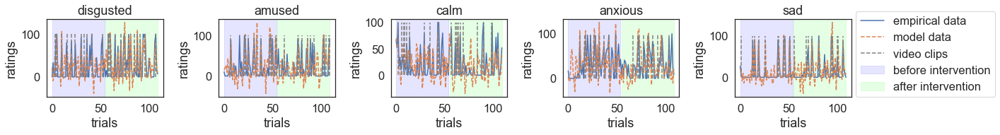

87 0.0


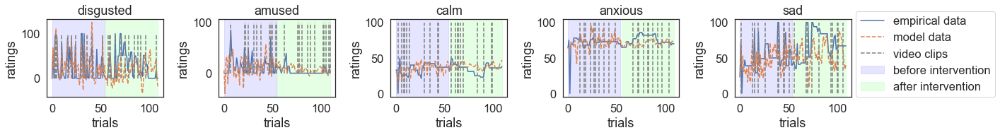

88 0.0


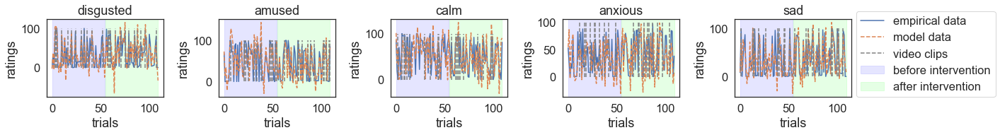

89 0.0


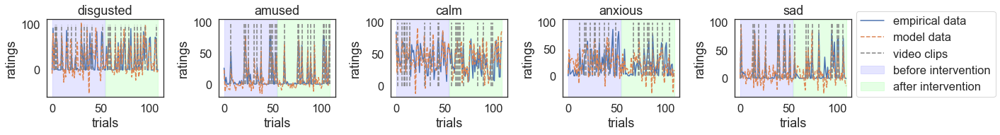

90 0.0


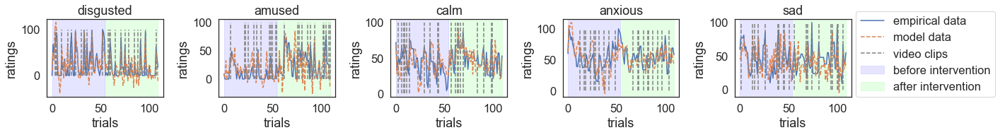

91 1.0


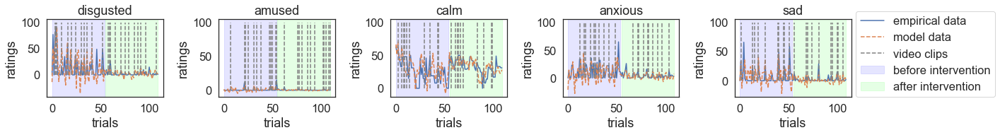

92 0.0


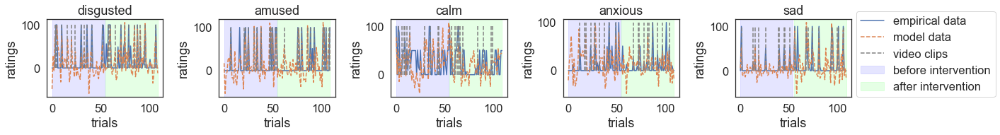

93 0.0


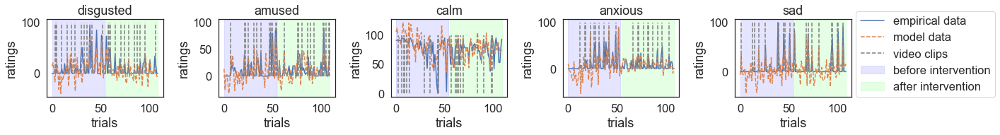

94 0.0


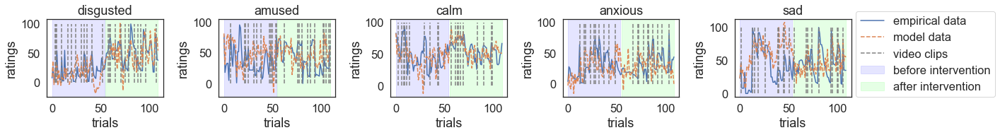

95 1.0


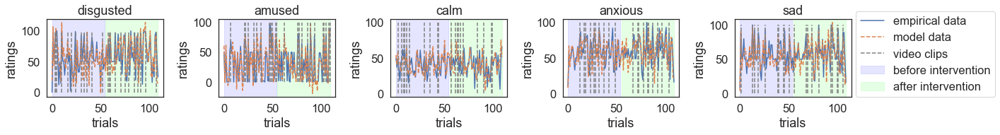

96 0.0


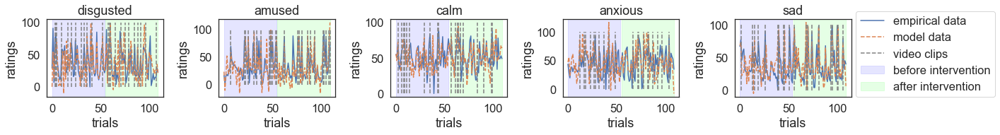

97 0.0


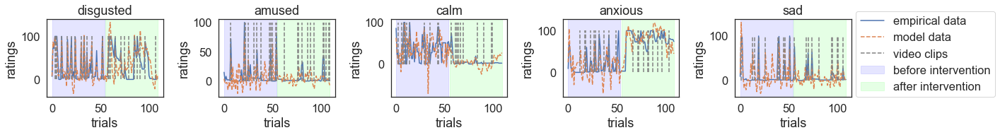

98 0.0


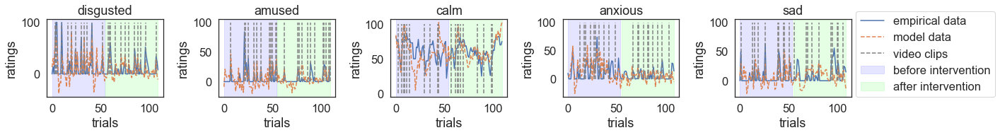

99 0.0


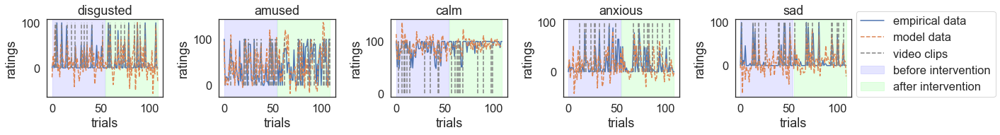

100 0.0


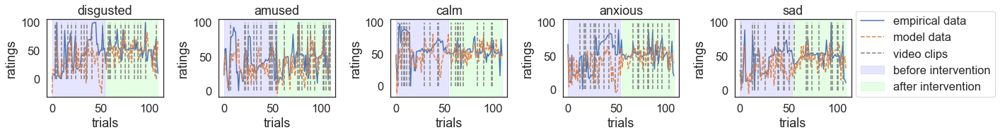

101 0.0


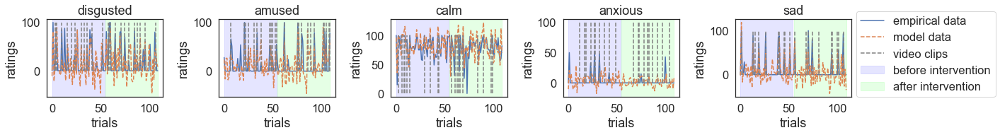

102 1.0


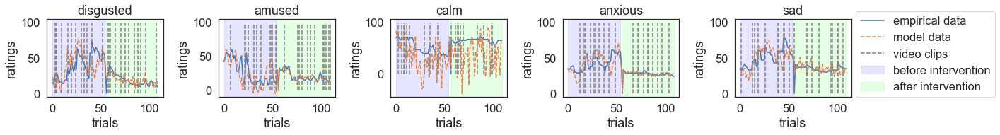

103 1.0


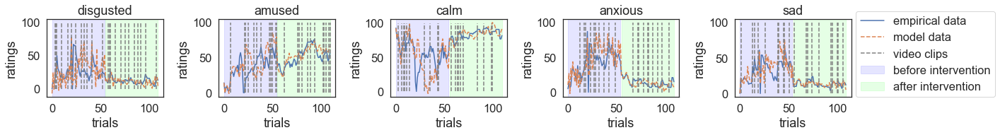

104 1.0


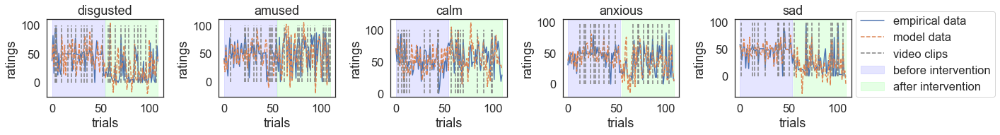

105 1.0


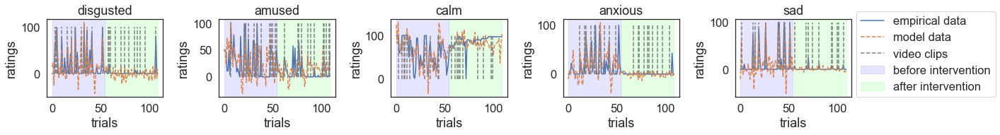

106 1.0


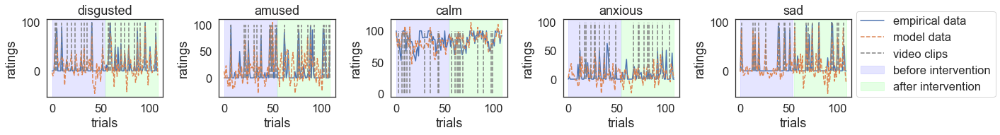

107 1.0


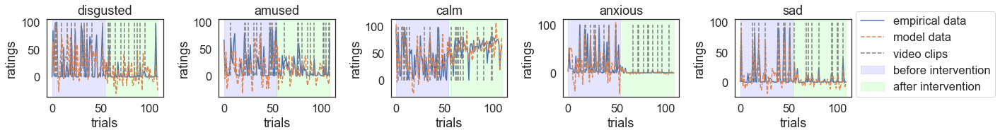

In [19]:
# show model fit
sns.set(style='white', font_scale=1.5)
# random_sub = np.random.randint(1,Nsj,3)
T = np.shape(data[0]['ratings'])[1]
for sj in range(Nsj):
    print(sj, df['randomized_condition'][sj])
    fig, axs = plt.subplots(1,len(mood_categories),figsize=[20,3])
    x = np.empty((T,5))
    for t in range(2):
        inp_split = inp[t*int(T/2):t*int(T/2) + int(T/2),:]
        z, x[t*int(T/2):t*int(T/2) + int(T/2),:] = \
        data[sj]['results_split'][13+t].sample(int(T/2),  initial_state=data[sj]['ratings'][:,t*int(T/2)], \
                                                control_inputs=inp_split)
        
    for k in range(len(mood_categories)):
        axs[k].plot(mood_ratings[:,k,sj]);
        axs[k].plot(x[:,k], linestyle='--');
        axs[k].set_title(mood_categories[k]);
        axs[k].set_ylabel('ratings');
        axs[k].set_xlabel('trials');
        axs[k].vlines(np.where(inp[:,k]), ymin=0, ymax=100, color='gray', linestyles = 'dashed')
        ylim = axs[k].get_ylim()
        axs[k].add_patch(plt.Rectangle((0, ylim[0]), 54, np.abs(ylim[0]) + ylim[1], edgecolor=(0, 0, 1, 0.1), facecolor=(0, 0, 1, 0.1)))
        axs[k].add_patch(plt.Rectangle((55, ylim[0]), 54, np.abs(ylim[0]) + ylim[1], edgecolor=(0, 1, 0, 0.1), facecolor=(0, 1, 0, 0.1)))
    plt.legend(['empirical data','model data', 'video clips','before intervention', 'after intervention'], loc=(1.04,0))
    plt.tight_layout()
#     plt.savefig(filepath + 'results/figures/modelfit_normalized' + str(sj) + '.png')
    plt.show()

In [12]:
# investigate outlier in parameter estimates
cc, dd, ss, gg = [np.full((5,5,len(data)), np.nan) for i in range(4)]
for i in range(len(data)):
    cc[:,:,i] = data[i]['results_split'][-1].control_matrix
    dd[:,:,i] = data[i]['results_split'][-1].transition_matrices
    gg[:,:,i] = data[i]['results_split'][-1].observation_covariance
    ss[:,:,i] = data[i]['results_split'][-1].transition_covariance

A outliers: [ 40  58 101]
C outliers: [40 58]
S outliers: [19 41 72]
G outliers: [ 25  32  35  37  39  81 102]


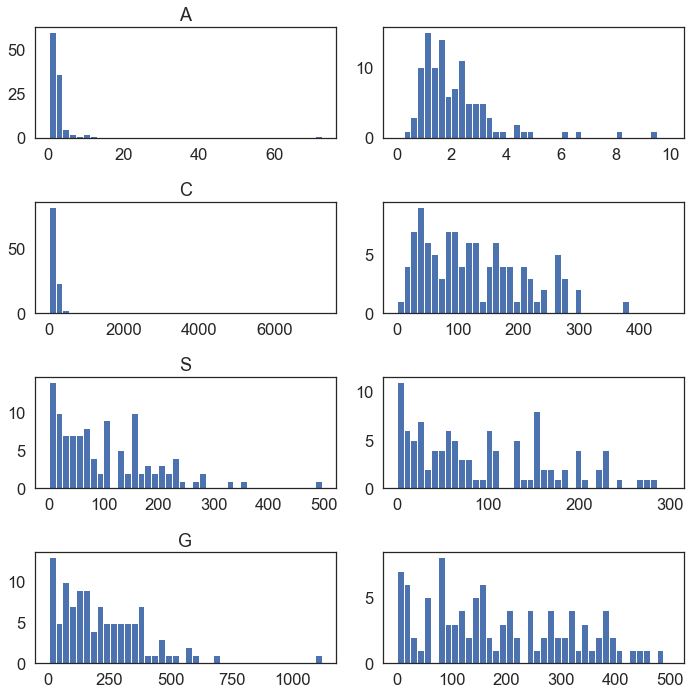

In [13]:
fig,ax = plt.subplots(4,2,figsize=(10,10))
cut = [10, 450, 300, 500]
label = ['A', 'C', 'S', 'G']
for j, i in enumerate([dd, cc, ss, gg]):
    ax[j, 0].hist(np.max(np.abs(i.reshape(25,Nsj)),axis=0), 40);
    ax[j, 0].set(title=label[j])
    ax[j, 1].hist(np.max(np.abs(i.reshape(25,Nsj)),axis=0), 40, range=(0,cut[j]));
    print(label[j] + ' outliers: ' + str(np.where(np.max(np.abs(i.reshape(25,Nsj)),axis=0)>cut[j])[0]))
fig.tight_layout()